<a href="https://colab.research.google.com/github/esusrutha/zeroshot/blob/main/zero_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install nltk networkx

In [ ]:
!pip install -U sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 59.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 49.6 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125926 sha256=52ebc70166639c04b0fd830e558c1659bcec5909c64ae7308b36198420e02dc2
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


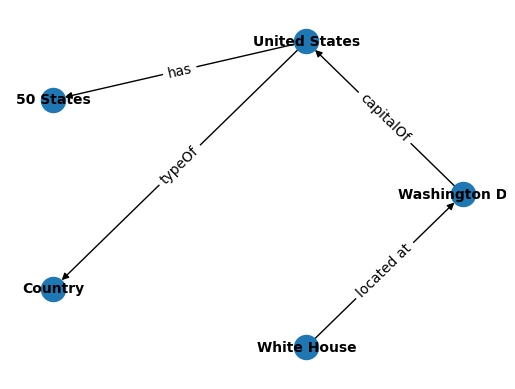

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import requests

# Define the nodes and relations
knowledge_graph = [
    ('Washington D.C.', 'capitalOf', 'United States'),
    ('United States', 'has', '50 States'),
    ('United States', 'typeOf', 'Country'),
    ('White House', 'located at', 'Washington D.C.')
]

# Create a NetworkX graph
graph = nx.DiGraph()  # Use DiGraph instead of Graph to indicate directed edges

# Iterate through the knowledge graph and retrieve additional information from ConceptNet API
for edge in knowledge_graph:
    source = edge[0]
    relation = edge[1]
    target = edge[2]

    # Make a request to ConceptNet API to fetch additional information
    api_url = f'http://api.conceptnet.io/c/en/{source}?rel=/r/{relation}&end=/c/en/{target}'
    response = requests.get(api_url)
    if response.status_code == 200:
        data = response.json()

        # Extract the weight from the API response
        weight = 1.0  # Default weight if not found
        if 'edges' in data and len(data['edges']) > 0 and 'weight' in data['edges'][0]:
            weight = data['edges'][0]['weight']

        # Add directed edges to the graph
        graph.add_edge(source, target, relation=relation, weight=weight)

# Set node positions using a circular layout
pos = nx.circular_layout(graph)

# Draw nodes and edges with arrowheads
nx.draw_networkx_nodes(graph, pos)
nx.draw_networkx_edges(graph, pos, arrows=True)  # Set arrows=True for directed edges

# Draw node labels
nx.draw_networkx_labels(graph, pos, font_size=10, font_weight='bold')

# Draw edge labels
edge_labels = nx.get_edge_attributes(graph, 'relation')
nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_labels)

# Display the graph
plt.axis('off')
plt.show()

In [ ]:
sentences = []
for edge in knowledge_graph:
    source = edge[0]
    relation = edge[1]
    target = edge[2]
    sentence = f"{source} {relation} {target}"
    sentences.append(sentence)
    print(sentences)

['Washington D.C. capitalOf United States']
['Washington D.C. capitalOf United States', 'United States has 50 States']
['Washington D.C. capitalOf United States', 'United States has 50 States', 'United States typeOf Country']
['Washington D.C. capitalOf United States', 'United States has 50 States', 'United States typeOf Country', 'White House located at Washington D.C.']


In [ ]:
!pip install nltk

In [ ]:
import nltk
nltk.download('words')

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


True

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
from nltk.tokenize import word_tokenize
from collections import Counter

tokenized_sentences = [word_tokenize(sentence) for sentence in sentences]
word_counts = Counter([word for sentence in tokenized_sentences for word in sentence])
vocabulary = list(word_counts.keys())


In [ ]:
import gensim.downloader as api

glove_model = api.load('glove-wiki-gigaword-100')

[==================================================] 100.0% 128.1/128.1MB downloaded


In [ ]:
word_vectors = {word: glove_model[word] for word in vocabulary if word in glove_model}

In [ ]:
knowledge_graph_embedding = []
for sentence in tokenized_sentences:
    sentence_vectors = [word_vectors[word] for word in sentence if word in word_vectors]
    if sentence_vectors:
        avg_vector = sum(sentence_vectors) / len(sentence_vectors)
        knowledge_graph_embedding.append(avg_vector)

In [ ]:
for embedding in knowledge_graph_embedding:
    print(embedding)

[ 0.082152    0.55732     0.21405199 -0.16241     0.42663002  0.048215
  0.1606735   0.3552     -0.4085225   0.301615    0.486645    0.210105
  0.3953655  -0.216695    0.14228499 -0.3276575   0.170604    0.01015884
 -0.22224998  0.408855    0.716245    0.38815     0.229665    0.1888445
  0.1262655  -0.26332998  0.10853501 -0.49602    -0.13658501 -0.309505
  0.221355    0.83281    -0.1230765   0.50250953  0.216965    0.37953
  0.347665    0.320747   -0.43827     0.3622775  -0.57938    -0.409445
  0.49532    -0.437855    0.300685   -0.1923815   0.19572002 -0.60129
  0.13566    -0.44006002 -0.13332    -0.609985   -0.016055    1.187455
 -0.40245003 -2.34165    -0.45047498 -0.33754     1.42215     0.95134
  0.393505    0.49286503 -0.1311105   0.042498    0.458041    0.20169501
  0.41669     0.183621    0.643355    0.030459    0.16112001 -0.182584
 -0.182766    0.3262085   0.270055   -0.33693    -0.029077    0.05824
 -1.1489251   0.1366485   0.960795   -0.12854001 -0.1505925  -0.249093
 -1.2

In [ ]:
from sentence_transformers import SentenceTransformer, models

In [ ]:
model_name =SentenceTransformer('all-MiniLM-L6-v2')

In [ ]:
from sentence_transformers import SentenceTransformer

model_name = 'all-MiniLM-L6-v2'
sbert_model = SentenceTransformer(model_name)

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import nltk
from transformers import AutoTokenizer

# Load the pre-trained S-BERT model tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Download the list of common English words from nltk
nltk.download("words")
common_words = set(nltk.corpus.words.words())

# Get the vocabulary words from the S-BERT model
vocab = tokenizer.get_vocab()
vocab_words = list(vocab.keys())

# Filter the vocabulary words to keep only the common English words
common_vocab_words = [word for word in vocab_words if word.lower() in common_words]

# Get the most common vocabulary words based on their frequencies
top_n = 100
common_vocab_freqs = [vocab[word] for word in common_vocab_words]
most_common_vocab = sorted(zip(common_vocab_words, common_vocab_freqs), key=lambda x: x[1], reverse=True)[:top_n]

# Store the most common vocabulary words in a list
stored_words = [word for word, _ in most_common_vocab]

# Print the stored vocabulary words
for word in stored_words:
    print(word)


[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


thyroid
nitrate
genealogical
dowry
collarbone
arsenic
pudding
disgrace
wreath
wince
inhuman
bobbed
papyrus
flourishing
penitentiary
inflated
boredom
abolitionist
squeak
enthusiast
infiltrate
upstate
rosewood
patrice
vet
foreigner
colossal
earthly
deprivation
taluka
stanza
embroidery
adventurer
unbroken
lough
adamant
polka
boardwalk
reindeer
attache
persist
enamel
effortlessly
yearning
loosen
ie
decorate
covent
strive
tread
holster
streamlined
seeker
taunting
unfit
stillness
bop
britten
sighting
juniper
moderator
elliptic
erroneously
figurative
aground
cinder
bipolar
rhapsody
delaying
vinegar
shouldered
foo
stampede
armchair
quadrant
tidy
piccolo
vulgar
fulfillment
compassionate
apologetic
amazingly
nay
irritating
ae
undeveloped
mangrove
nosed
distal
compressor
dung
unofficially
discreet
bien
mania
contentious
cleric
indices
markedly
geek


In [ ]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
vocabulary_embeddings=model.encode(stored_words)
print(vocabulary_embeddings)

[[-3.8380921e-02  1.3844410e-02  5.0948430e-03 ...  6.4140186e-02
   1.1741676e-01 -3.9527258e-03]
 [-3.7052069e-02 -8.4874360e-03  6.0293154e-04 ... -3.5221867e-02
   8.7065175e-02  2.5798377e-02]
 [-7.2317772e-02  7.2963135e-03 -2.5461772e-02 ...  2.3224093e-02
   3.2639783e-02 -1.2676468e-02]
 ...
 [ 2.2606410e-02  2.9712142e-02  1.3109762e-03 ... -9.9349460e-03
  -3.7202500e-02 -8.5346565e-02]
 [ 6.9983475e-02  1.9223118e-04  2.6189251e-02 ... -2.5095787e-05
   1.0565958e-02 -9.0330489e-02]
 [-5.8677170e-02  2.5966318e-02  4.0841013e-02 ...  5.4054584e-02
   2.5494987e-02 -7.9530112e-02]]


In [ ]:
word_vectors = {word: glove_model[word] for word in stored_words if word in glove_model}

In [ ]:
knowledge_graph_embedding = []
for word in stored_words:
    if word in word_vectors:
        word_vector = word_vectors[word]
        knowledge_graph_embedding.append(word_vector)

for embeddings in knowledge_graph_embedding:
    print(embeddings)


[ 0.48893   0.323    -0.5664    0.54652  -0.75107  -0.17408   0.095883
  0.6351    0.47999   0.74358   0.032241 -0.31264  -0.33028  -0.16298
  0.53532   0.11402   0.030276 -0.43082   1.0655   -0.57941  -1.0389
 -0.51304  -0.36444   0.966    -0.23017   0.79514   0.13084  -0.87703
  0.75949   0.95471   1.0031   -0.39215   0.44971   0.066119  0.38113
  0.42087   0.088008  0.89148  -0.023006  0.67835  -0.27608  -0.085201
  0.052242 -1.1608    0.44534   0.55546   0.55335  -0.66955  -0.954
  0.33651   0.71218  -0.16462  -0.31668  -0.04326   0.13417   0.19796
 -0.47156  -0.43079  -0.17055   0.78007   0.52245   0.95924   0.81301
 -0.86145  -0.14469   0.1471   -0.12425  -0.67646   0.99387  -0.90612
  0.38339   0.40232  -0.058266  0.73459   0.61205  -0.92129  -0.48865
 -0.28498   0.29858   0.056968  0.4388   -0.44448  -0.5813    0.90073
 -0.94619  -0.058002  0.57628   1.552    -1.0457   -0.13319  -0.73415
 -0.85074  -0.14169   0.88286   0.70816   0.07654   0.22504  -1.2187
 -0.14346  -0.28606 ]


In [ ]:
import numpy as np

def learn_projection_matrix(embeddings, vocabulary_embeddings):
    # Center the S-BERT embeddings
    embeddings_centered = embeddings - np.mean(embeddings, axis=0)

    # Center the knowledge graph embeddings
    vocabulary_embeddings_centered = vocabulary_embeddings - np.mean(vocabulary_embeddings, axis=0)

    # Perform least squares regression to find the projection matrix
    P = np.linalg.lstsq(embeddings_centered, vocabulary_embeddings_centered, rcond=None)[0]

    # Project the S-BERT embeddings using the projection matrix
    embeddings_projected = embeddings @ P

    return P, embeddings_projected


# Assume X and Y are the S-BERT embeddings and knowledge graph embeddings respectively

# Generate random S-BERT embeddings and knowledge graph embeddings for demonstration
np.random.seed(42)
embeddings = np.random.rand(100, 768)
vocabulary_embeddings = np.random.rand(768, 100)

# Learn the projection matrix
projection_matrix, projected_embeddings = learn_projection_matrix(embeddings, vocabulary_embeddings)

# Print the projection matrix
print("Projection Matrix:")
print(projection_matrix)


# Print the projected knowledge graph embeddings
print("Projected Knowledge Graph Embeddings:")
print(projected_embeddings)

LinAlgError: ignored

In [ ]:
def categorize_classes(newsgroups_data):
    label = {
        "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware"],
        "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
        "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
        "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
        "Vehicle": ["rec.autos", "rec.motorcycles"],
        "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"]
    }

    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = []
        for class_name in newsgroups_data:
            if class_name in label_list:
                categorized_classes[category].append(class_name)

    return categorized_classes

classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware","alt.atheism", "soc.religion.christian", "talk.religion.misc","rec.sport.baseball", "rec.sport.hockey","talk.politics.guns", "talk.politics.mideast", "talk.politics.misc","rec.autos", "rec.motorcycles","sci.crypt", "sci.electronics", "sci.med", "sci.space"]

categorized_classes = categorize_classes(classes)

for category, label_list in categorized_classes.items():
    print(f" '{category}': {label_list}")

 'Computer': ['comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware']
 'Religion': ['alt.atheism', 'soc.religion.christian', 'talk.religion.misc']
 'Sports': ['rec.sport.baseball', 'rec.sport.hockey']
 'Politics': ['talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc']
 'Vehicle': ['rec.autos', 'rec.motorcycles']
 'Science': ['sci.crypt', 'sci.electronics', 'sci.med', 'sci.space']


In [ ]:
from sentence_transformers import SentenceTransformer
import numpy as np

def encode_categories(categorized_classes):
    # Load the pre-trained S-BERT model
    model = SentenceTransformer('all-MiniLM-L6-v2')

    encoded_categories = {}

    for category, label_list in categorized_classes.items():
        category_labels = label_list[:-1]  # Exclude the mean embedding from the labels
        category_mean_embedding = label_list[-1]

        # Encode the category labels using S-BERT
        label_embeddings = model.encode(category_labels)

        # Reshape the mean embedding to have the same dimensions as the label embeddings
        category_mean_embedding = np.tile(category_mean_embedding, (len(label_embeddings), 1))

        # Concatenate the label embeddings with the mean embedding
        category_embeddings = np.concatenate((label_embeddings, category_mean_embedding), axis=1)

        encoded_categories[category] = category_embeddings

    return encoded_categories

# Assuming you have already obtained the categorized_classes dictionary

encoded_categories = encode_categories(categorized_classes)

for category, embeddings in encoded_categories.items():
    print(f"Category: {category}")
    print(f"Embeddings: {embeddings}")
    print()


Category: Computer
Embeddings: [['-0.0066898195' '8.2911174e-05' '-0.008561035' ... '-0.0034751296'
  '-0.032330748' 'comp.sys.mac.hardware']
 ['-0.050009098' '-0.022203974' '-0.04003927' ... '-0.02600444'
  '0.08031433' 'comp.sys.mac.hardware']
 ['-0.042476196' '-0.02756592' '-0.045346014' ... '0.031532798'
  '-0.044363115' 'comp.sys.mac.hardware']]

Category: Religion
Embeddings: [['0.018435623' '-0.06275192' '-0.036271352' '0.0028996984' '0.017010085'
  '-0.022169998' '0.090347216' '0.010394971' '0.129721' '0.026094757'
  '0.04772658' '0.0027571914' '0.03436942' '-0.06007186' '-0.0061092973'
  '0.05493457' '-0.06604713' '-0.04749811' '-0.04608714' '0.017634459'
  '-0.091371566' '-0.02246499' '-0.07387882' '-0.009286047' '0.04136559'
  '-0.04809347' '-0.016391713' '0.026737629' '-0.06161353'
  '-0.0058238395' '-0.05570348' '-0.053100657' '0.0013604513'
  '-0.01375632' '-0.02111595' '0.049157705' '0.05684878' '0.075012155'
  '-0.013491564' '-0.07406937' '-0.005319056' '-0.05699666' '-

In [ ]:
import numpy as np

def project_label_embeddings(encoded_categories, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_labelembeddings = encoded_categories @projected_embeddings

    return projected_labelembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
encoded_categories = np.random.rand(100, 50)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_labelembeddings = np.random.rand(50, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(encoded_categories, projected_labelembeddings)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)


Projected label Embeddings:
[[11.81978884 12.36351431 12.52025368 ... 13.59142728 14.28771171
  12.500359  ]
 [11.30159564  8.02319179 10.7913416  ... 12.18235361 13.19090784
  10.55180705]
 [13.67169399 13.60206682 14.5829454  ... 14.48255665 14.11490638
  13.18943405]
 ...
 [14.22076579 12.43028077 13.59290737 ... 12.81740169 14.475121
  12.56587959]
 [12.46851338 11.90078811 13.38244145 ... 12.83852258 13.49898742
  12.82585857]
 [14.89427344 12.92071083 13.78220349 ... 13.49871483 15.82421352
  14.0103558 ]]


In [ ]:
print(projected_label_embeddings.shape)

(20, 20)


In [ ]:
import re
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the list of categories
categories_list = newsgroups_data.target_names

# Preprocess and extract sentences from each category
for category in categories_list:
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get documents for the current category
    documents = fetch_20newsgroups(subset='all', categories=[category])

    for document in documents.data:
        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")

from acoopermacccmacalstredu turin turambar me department of utter misery
subject re societally acceptable behavior
organization macalester college
lines 

in article csasnewscsouiucedu cobbalexialisuiucedu mike cobb writes
 i guess im delving into a religious language area  what exactly is morality 
 or morals  

i hope there is not one with a subject like this you just have a spiral  what
would then be a morality of a morality of morals  labels dont make arguments 
one really needs a solid measuring stick by which most actions can be
interpreted even though this would hardly seem moral  for example the best
thing for me is to ensure that i will eat and drink enough  hence all actions
must be weighed against this one statement  whatever helps this goal is
moral whatever does not is immoral

of course this leads such a blank space there are so many different ways to
fulfill a goal one would need a hypermorality to apply to just the methods

i never thought of eating meat to be moral or

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
   that certainly isnt a requirement

  nondos operating systems os nt  various unices or whatever the
   proper plural of unix might be require the use of irq  for performance
   reasons  

and the sb alas is one of the cards which uses bistate drivers

joe morris  mitre  jcmorrismitreorg
from chriscraytonozoneholecom chris crayton 
subject date is stuck
distribution world
organization ozone online operations inc  new orleans la
replyto chriscraytonozoneholecom chris crayton 
lines 

 on    michael shapiro had the unmitigated gall to say this

 ms the dos system date has a twentyfour hour clock and a rollover bit
 ms when the system crosses midnight the rollover bit is turned on  
 ms subsequent reads of the time add one  theres no change possible

 ms this information was current up through dos   ive not checked to
 ms see whether it applies to later versions

just a small tidbit with the advent of dos  and later versions ms added
a 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
design of the box is all wrong wouldve been better if ms had put most
of windows on a plugin rom card from day one priced at  or
so people woulda loved it

apple had the right idea just stumbled a bit in the execution

pete


peter l wargo       wargoplsunsoeclarksonedu  email saves trees
documentation                                     it also makes the
enable software       x          world smaller
from doucetfsquadmnorg andrew geweke
subject lc ii slowdowns
organization tfsquad public access usenet st paul mn    
lines 

        i am currently managing among many other labs a lab with three 
lc iis a mac plus with  mb external hd and a laserwriter ii ntx my 
problem the lc iis seem to intermittently slow to a snails pace
        these lc iis have  mb ram k vram and a quantum lps hd 
installed i have reformatted the drive with hard disk toolkit  and 
it gives a very respectable  overall rating to this drive so its not 
the drive i h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.

please email me any info  if i get anything interesting ill compile
it and get it on the net  thanks

   
   marty capadona                              martycartercaboeingcom
                                               seattle wa
    gpz  gs  hawk gt  gs
   ama msf wmrra omrra                   forget what i said
from tobiasconvexcom allen tobias
subject re type spesifications cb vfr gt etc
nntppostinghost hydraconvexcom
organization convex computer corporation richardson tx usa
xdisclaimer this message was written by a user at convex computer
              corp the opinions expressed are those of the user and
              not necessarily those of convex
lines 

in article rvklnragateberkeleyedu robinsoncogsciberkeleyedu michael robinson writes
in article apradobecom cjacksonadobecom curtis jackson writes
in article cskdcpsrgenprpsrhpcom frankbsadhpcom frank ball writes
honda  a v designates a v engine street bike vf for v
vt for

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from gtoalgtoalcom graham toal
subject re text of white house announcement and qas on clipper chip encryption
lines 

bred wrote
	and this means that the fbi will want to track the customer lists of
	better encryption phones because the only reason a person would want
	one is to evade the police

they dont have to track customer lists  they merely have to digitally
listen to any phone line and eliminate any that dont have the clipper
headersignature  noone has said how it will be modulated  want a bet
its a nonstandard and hence easily recognisable baudrate

devices to scan exchanges and detect modems etc already exist  ive seen
them advertised in the trade press

once you eliminate crippled crypto devices and ordinary data modems whats
left is crypto worth looking more closely at  i guess any substitute scheme
will have to be vbis or vfast to disguise it though then they just start
looking at the data too

whatever happens though the effect of this new chip will be to make private
cry

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from awsitiorg allen w sherzer
subject re orbital repairstation
organization evil geniuses for a better tomorrow
lines 

in article chcbojoyzootorontoedu henryzootorontoedu henry spencer writes

the biggest problem with this is that all orbits are not alike  it can
actually be more expensive to reach a satellite from another orbit than
from the ground  

but with cheaper fuel from space based sources it will be cheaper to 
reach more orbits than from the ground

also remember that the presence of a repairsupply facility adds value
to the space around it if you can put your satellite in an orbit where it
can be reached by a ready source of supply you can make it cheaper and gain
benefit from economies of scale

  allen
 

 lady astor   sir if you were my husband i would poison your coffee   
 w churchill madam if you were my wife i would drink it             
 days to first flight of dcx
from wingocsparadecnetfedexmsfcnasagov
subject re nasa wraps
organization university of houston
line

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
new zealand was willing to cooperate and south georgia island
was virtually uninhabited except for a whaling station on the
northeast coast  the whaling station was some  miles away from
the secret new installation which was being built but britain
took no chances  in  the whaling station was closed down 
since that time there have been no inhabitants on south georgia
island except for a few dozen alleged antarctic scientists

   construction of the secret naval facilitiestwo in new
zealand one on south georgia islandbegan in the early s 
the techniques were adapted from those used previously to build
other large underground facilities such as the norad
installation inside cheyenne mountain colorado however these
techniques were adapted in radically new ways to achieve
construction access directly from the sea instead of overland 
in this way the sheltering mountain was left undisturbed in
appearance both during and after construction


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
sentences_embeddings=model.encode(sentence)
print(sentences_embeddings)

[ 2.02295203e-02  6.81862235e-02 -3.37931514e-02  6.34600669e-02
  1.17296211e-01  8.40166770e-03  1.32918656e-02  2.44065709e-02
 -5.73105030e-02 -2.00016070e-02 -7.93780163e-02  5.92354275e-02
  3.36128771e-02  1.14933830e-02 -2.33667493e-02 -2.57260483e-02
 -4.92267311e-02 -1.63177028e-02 -7.24782944e-02  6.89134793e-03
  4.34827022e-02  2.69615445e-02 -1.61900260e-02  4.52616103e-02
 -7.80871660e-02  7.38854632e-02  2.15216540e-02  3.39287296e-02
 -2.95486711e-02  4.42567170e-02  1.05189309e-01  3.47023979e-02
 -3.88101488e-02  1.36244076e-03  9.88432020e-02 -5.68934269e-02
  6.53950945e-02  6.84759580e-03  2.04207245e-02  3.60927135e-02
  1.63629781e-02 -8.44061226e-02 -1.88699439e-02  1.80434696e-02
 -2.95743532e-02  1.45962173e-02 -2.78400611e-02 -3.00803073e-02
 -1.69730149e-02  3.11496737e-03 -3.15096006e-02  4.16102856e-02
 -7.21282586e-02  3.82583886e-02 -3.18046995e-02 -1.58107430e-01
  1.70875713e-02 -1.34399831e-02  3.90912704e-02 -9.86345932e-02
  8.19556192e-02  1.33589

In [ ]:
import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 50)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_embeddings = np.random.rand(50, 100)

# Project label embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)


Projected Sentence Embeddings:
[[11.27753848  9.26915828 12.92793522 ... 10.39547609 10.6457029
  11.59448885]
 [14.05236327 12.29817928 14.89972713 ... 11.71433102 13.39242523
  13.81594384]
 [12.02266454 10.40060439 12.63953409 ... 10.7907153  10.3267918
  11.79875807]
 ...
 [10.4744961   8.84615591 12.21409972 ... 10.11992237 10.7634051
  11.73368094]
 [13.56673795 10.95057064 14.34705524 ... 11.5004916  12.98082532
  12.21573089]
 [11.00000202  8.85606261 10.7571354  ...  9.7623689   9.96217987
  11.28489772]]


In [38]:
def categorize_classes(classes):
    label = {
        "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x"],
        "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
        "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
        "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
        "Vehicle": ["rec.autos", "rec.motorcycles"],
        "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"],
         "Sale":["misc.forsale"]
    }

    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = [class_name for class_name in classes if class_name in label_list]

    return categorized_classes

classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

categorized_classes = categorize_classes(classes)

for category, label_list in categorized_classes.items():
    print(f"'{category}': {label_list}")

import torch
from transformers import AutoModel, AutoTokenizer

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Tokenize the class name
    tokens = tokenizer.encode(class_name, truncation=True, padding='longest', max_length=128, return_tensors='pt')

    # Get the S-BERT embeddings for the class tokens
    with torch.no_grad():
        embeddings = model(tokens).last_hidden_state.squeeze(0).mean(dim=0)

    # Store the embeddings in the dictionary
    class_embeddings[class_name] = embeddings

# Print the class embeddings
for class_name, embeddings in class_embeddings.items():
    print(f"Class: {class_name}")
    print(f"Embeddings shape: {embeddings.shape}")
    print(f"Embeddings: {embeddings.tolist()}")
    print()


print(embeddings.shape)

import numpy as np

def project_label_embeddings(embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_labelembeddings = embeddings @projected_embeddings

    return projected_labelembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_labelembeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(embeddings, projected_labelembeddings)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)

print(projected_label_embeddings.shape)



'Computer': ['comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 'comp.windows.x']
'Religion': ['alt.atheism', 'soc.religion.christian', 'talk.religion.misc']
'Sports': ['rec.sport.baseball', 'rec.sport.hockey']
'Politics': ['talk.politics.guns', 'talk.politics.mideast', 'talk.politics.misc']
'Vehicle': ['rec.autos', 'rec.motorcycles']
'Science': ['sci.crypt', 'sci.electronics', 'sci.med', 'sci.space']
'Sale': ['misc.forsale']
Class: comp.graphics
Embeddings shape: torch.Size([384])
Embeddings: [-0.04351150989532471, 0.0005394679610617459, -0.05568178370594978, -0.45668479800224304, 0.10569586604833603, -0.29022952914237976, 0.39068686962127686, 0.5179983973503113, 0.1691620796918869, -0.27813875675201416, 0.2595534324645996, 0.32711246609687805, -0.3482637405395508, 0.1355583220720291, 0.03742675110697746, 0.10942336916923523, 0.127774178981781, -0.08506730198860168, 0.37524595856666565, -0.050021324306726456, -0.2454497367143631, -0.671406

In [39]:
import re
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the list of categories
categories_list = newsgroups_data.target_names

# Preprocess and extract sentences from each category
for category in categories_list:
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get documents for the current category
    documents = fetch_20newsgroups(subset='all', categories=[category])

    for document in documents.data:
        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")


from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
sentences_embeddings=model.encode(sentence)
print(sentences_embeddings)


print(sentences_embeddings.shape)


import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_embeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)


print(projected_sentence_embeddings.shape)

Streaming output truncated to the last 5000 lines.
lines 
replyto afclevelandfreenetedu chad cipiti
nntppostinghost helainscwruedu


hi  im looking for a d shark for use in a ray tracing rountine im doing
 ill be using vivid or pov but it can be in any format  are there any
 ftp sites with d objects or does anyone have a good d shark

thanks alot

chad


 
                       new in                                 
          sea world of ohio           chad cipiti         
   shark                            cipitibobcatentohiouedu
  encounter      make contact     afclevelandfreenetedu
from ivanov sergey sergeargusmsksu
subject re re vga x graphics mode
distribution world
organization commercial and industrial group argus
replyto sergeargusmsksu
lines 

 my a vesa tsr supports this

 can you report crt and other register state in this mode 
 thanks

        serge ivanov sergeargusmsksu
from jornakubnl aegeetilburg remco jorna
subject cgm garphics viewer wanted
organization tilburg 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
design of the box is all wrong wouldve been better if ms had put most
of windows on a plugin rom card from day one priced at  or
so people woulda loved it

apple had the right idea just stumbled a bit in the execution

pete


peter l wargo       wargoplsunsoeclarksonedu  email saves trees
documentation                                     it also makes the
enable software       x          world smaller
from doucetfsquadmnorg andrew geweke
subject lc ii slowdowns
organization tfsquad public access usenet st paul mn    
lines 

        i am currently managing among many other labs a lab with three 
lc iis a mac plus with  mb external hd and a laserwriter ii ntx my 
problem the lc iis seem to intermittently slow to a snails pace
        these lc iis have  mb ram k vram and a quantum lps hd 
installed i have reformatted the drive with hard disk toolkit  and 
it gives a very respectable  overall rating to this drive so its not 
the drive i h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
of course these postings sould be in soccultureus but if we reduce
crime here it ll mean less car insurance rates thus we could spend
more money on modifing our cars now my posting is recautostech 
revelant

vlasis  theodore


software engineer
idb mobile communications

sig under development 

i remember this happening on the i through michigan and ohio several
years back a group of guys in an old beater would rear end a car
usually out of state or canadians you stop and they smack you with a bb
bat at least they didnt kill you for the sake of a car
i think the cops put out decoys and this calmed down for a while

vlasis are you safe walking through germany if you are a refugee
from musicerichtriumfca fred w bach
subject re warningplease read
organization triumf triuniversity meson facility
lines 
distribution world
nntppostinghost erichtriumfca
newssoftware vaxvms vnews     

in article aprconvexcom tobiasconvexcom allen tobias write

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from maynardramseycslaurentianca roger maynard
subject re wings take game one
keywords the detroit red wings    the toronto maple leafs  
organization dept of computer science laurentian university sudbury on
lines 

in qvosrmsuinfoclmsuedu vergolineulerlbsmsuedu david vergolini writes

  the detroit red wings put a lot of doubter on ice tonight with a   
washing of the toronto maple leafs  all you toronto fans have now seen the
power of the mighty red wing offense  torontos defense in no match for the
wing offense  as for the defense probert kennedey and primeau came out

did they move probert back to defense  why did i see him parking his ass
in front of potvin all night  somebody is going to have to discipline
probert if the leafs want to win the series  perhaps a fresh clark should
hit the ice at the end of a long probert shift and straigten him out for
a while


 

cordially as always                      maynardramseycslaurentianca 
                                           so m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from dstockhpqmocasqfhpcom david stockton
subject re krillean photography
nntppostinghost hpqmocbsqfhpcom
organization hewlettpackard ltd south queensferry scotland
xnewsreader tin version  pl
lines 

vinci filipevxcrnacernch wrote



  how about kirlian imaging  i believe the faq for sciskeptics sp
  has a nice writeup on this they would certainly be most supportive
  on helping you to build such a device and connect to a kvolt
  supply so that you can take a serious look at your aura 

  filipe santos
  cern  european laboratory for particle physics
  switzerland


    this has to be the only generally accepted method of using common 
physics lab equipment to find certain answers to all the questions about
afterlifes heavens hells purgatory gods etc krillean photography
will probably be ignored as insignificant compared to these larger
eternal verities publishing your results could be a bit of a problem
though

   cheers
             david
from stgpraostunocalcom richard ottolini
sub

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




from tffreebaindyvaxiupuiedu
subject re death and taxes was why not give  billion to
lines 

in article aprbbycomau gnbbabybbycomau gregory n bond writes
 in article aprindyvaxiupuiedu tffreebaindyvaxiupuiedu writes
 
      so how about this  give the winning group
    i cant see one company or corp doing it a   or  year
    moratorium on taxes
 
 you are talking about the bozos who cant even manage in november to
 keep promises about taxes made in october and you expect them to make
 and keep a year promise like that  

we want to give lawyers something to do in the st cen dont we

your faith in the political
 system is much higher than mine  i wouldnt even begin to expect that
 in australia and we dont have institutionalised corruption like you
 do

oh i bet you do  they are probably just better at it than our crooks 

 
 gregory bond gnbbbycomau burdett buckeridge  young ltd melbourne australia
    knoxs  is slick            fox in sox on knoxs box
    knoxs box is very quick      

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
could you please tell me what was the ethnic composition of 
israel right after it was formed 

	 israeli citizens  the ethnic composition depends on what
you mean by formed  what the un deeded to israel  what it won in war

 	and no i do not consider the purchase of land a hostile
 action  when someone wants to buy land and someone else is willing
 to sell it at a mutually agreeable price then that is commerce  it
 is not a hostile action leading to war

no one in his right mind would sell his freedom and dignity
palestinians are no exception perhaps you heard about
antitrust in the business world

	were there antitrust laws in place in mandatory palestine
since the answer is no youre argument while interestingly
constructed is irrelevant  i will however respond to a few points
you assert in the course of talking about antitrust laws


they were establishing a bridgehead for the european jews

	and those fleeing arab lands where jews 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.02295203e-02  6.81862235e-02 -3.37931514e-02  6.34600669e-02
  1.17296211e-01  8.40166770e-03  1.32918656e-02  2.44065709e-02
 -5.73105030e-02 -2.00016070e-02 -7.93780163e-02  5.92354275e-02
  3.36128771e-02  1.14933830e-02 -2.33667493e-02 -2.57260483e-02
 -4.92267311e-02 -1.63177028e-02 -7.24782944e-02  6.89134793e-03
  4.34827022e-02  2.69615445e-02 -1.61900260e-02  4.52616103e-02
 -7.80871660e-02  7.38854632e-02  2.15216540e-02  3.39287296e-02
 -2.95486711e-02  4.42567170e-02  1.05189309e-01  3.47023979e-02
 -3.88101488e-02  1.36244076e-03  9.88432020e-02 -5.68934269e-02
  6.53950945e-02  6.84759580e-03  2.04207245e-02  3.60927135e-02
  1.63629781e-02 -8.44061226e-02 -1.88699439e-02  1.80434696e-02
 -2.95743532e-02  1.45962173e-02 -2.78400611e-02 -3.00803073e-02
 -1.69730149e-02  3.11496737e-03 -3.15096006e-02  4.16102856e-02
 -7.21282586e-02  3.82583886e-02 -3.18046995e-02 -1.58107430e-01
  1.70875713e-02 -1.34399831e-02  3.90912704e-02 -9.86345932e-02
  8.19556192e-02  1.33589

In [44]:
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the class labels
classes = newsgroups_data.target_names

# Print the classes
for class_name in classes:
    print(class_name)
def categorize_classes(classes):
    label = {
        "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x"],
        "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
        "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
        "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
        "Vehicle": ["rec.autos", "rec.motorcycles"],
        "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"],
         "Sale":["misc.forsale"]
    }

    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = [class_name for class_name in classes if class_name in label_list]

    return categorized_classes

classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

categorized_classes = categorize_classes(classes)

for category, label_list in categorized_classes.items():
    print(f"'{category}': {label_list}")

import torch
from transformers import AutoModel, AutoTokenizer

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModel.from_pretrained(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Tokenize the class name
    tokens = tokenizer.encode(class_name, truncation=True, padding='longest', max_length=128, return_tensors='pt')

    # Get the S-BERT embeddings for the class tokens
    with torch.no_grad():
        embeddings = model(tokens).last_hidden_state.squeeze(0).mean(dim=0)

    # Store the embeddings in the dictionary
    class_embeddings[class_name] = embeddings

# Print the class embeddings
for class_name, embeddings in class_embeddings.items():
    print(f"Class: {class_name}")
    print(f"Embeddings shape: {embeddings.shape}")
    print(f"Embeddings: {embeddings.tolist()}")
    print()


print(embeddings.shape)

import numpy as np

def project_label_embeddings(embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_labelembeddings = embeddings @projected_embeddings

    return projected_labelembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_labelembeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_label_embeddings = project_label_embeddings(embeddings, projected_labelembeddings)

# Print the projected embeddings
print("Projected label Embeddings:")
print(projected_label_embeddings)

print(projected_label_embeddings.shape)







import re
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.datasets import fetch_20newsgroups

# Fetch the 20 Newsgroups dataset
newsgroups_data = fetch_20newsgroups()

# Get the list of categories
categories_list = newsgroups_data.target_names

# Preprocess and extract sentences from each category
for category in categories_list:
    # Initialize a list to store preprocessed sentences
    preprocessed_sentences = []

    # Get documents for the current category
    documents = fetch_20newsgroups(subset='all', categories=[category])

    for document in documents.data:
        # Remove question marks, special symbols, numbers, and URLs
        text = re.sub(r'\?', '', document)
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        text = re.sub(r'http\S+|www\S+', '', text)

        # Convert text to lowercase
        text = text.lower()

        # Tokenize the text into sentences
        sentences = sent_tokenize(text)

        # Preprocess and add sentences to the list
        for sentence in sentences:
            # Remove leading/trailing whitespaces
            sentence = sentence.strip()

            # Skip empty sentences
            if not sentence:
                continue

            preprocessed_sentences.append(sentence)

    # Print the preprocessed sentences
    for sentence in preprocessed_sentences:
        print(sentence)
    print("\n")


from sentence_transformers import SentenceTransformer
model = SentenceTransformer('all-MiniLM-L6-v2')
sentences_embeddings=model.encode(sentence)
print(sentences_embeddings)


print(sentences_embeddings.shape)


import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project label embeddings using the projection matrix
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume label_embeddings is a matrix of Label S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 384)

# Assume projection_matrix is the projection matrix with dimensions (d x k)
projected_embeddings = np.random.rand(384, 100)

# Project label embeddings into the knowledge graph embedding space
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_embeddings)

# Print the projected embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)


print(projected_sentence_embeddings.shape)


Streaming output truncated to the last 5000 lines.

 ill think more about it until then here is a general question
 suppse x were unfalsifiable is notx also unfalsifiable 

no by way of a counterexample let x  the coin is fair or more
accurately so that notx makes sense the two sides of the coin are
different this is unfalsifiable by tossing the coin even a string of
heads is consistent with a fair coin and you have to go to an infinite
number of tosses to falsify x in the limit its converse is falsifiable
and is falsified when at least one head and at least one tail have appeared

 this is partly whats wrong with you baysian argument  which 
 requires observations x  xn to be made there are simply 
 no such observations that have a truth value in relation to the 
 statement god exists now by use of your symmetry argument i 
 can understand why someone would say since the statement 
 god does not exist
   
 makes no predictions i will choose not to believe it but none
 the less this wo

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
design of the box is all wrong wouldve been better if ms had put most
of windows on a plugin rom card from day one priced at  or
so people woulda loved it

apple had the right idea just stumbled a bit in the execution

pete


peter l wargo       wargoplsunsoeclarksonedu  email saves trees
documentation                                     it also makes the
enable software       x          world smaller
from doucetfsquadmnorg andrew geweke
subject lc ii slowdowns
organization tfsquad public access usenet st paul mn    
lines 

        i am currently managing among many other labs a lab with three 
lc iis a mac plus with  mb external hd and a laserwriter ii ntx my 
problem the lc iis seem to intermittently slow to a snails pace
        these lc iis have  mb ram k vram and a quantum lps hd 
installed i have reformatted the drive with hard disk toolkit  and 
it gives a very respectable  overall rating to this drive so its not 
the drive i h

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
of course these postings sould be in soccultureus but if we reduce
crime here it ll mean less car insurance rates thus we could spend
more money on modifing our cars now my posting is recautostech 
revelant

vlasis  theodore


software engineer
idb mobile communications

sig under development 

i remember this happening on the i through michigan and ohio several
years back a group of guys in an old beater would rear end a car
usually out of state or canadians you stop and they smack you with a bb
bat at least they didnt kill you for the sake of a car
i think the cops put out decoys and this calmed down for a while

vlasis are you safe walking through germany if you are a refugee
from musicerichtriumfca fred w bach
subject re warningplease read
organization triumf triuniversity meson facility
lines 
distribution world
nntppostinghost erichtriumfca
newssoftware vaxvms vnews     

in article aprconvexcom tobiasconvexcom allen tobias write

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



from maynardramseycslaurentianca roger maynard
subject re wings take game one
keywords the detroit red wings    the toronto maple leafs  
organization dept of computer science laurentian university sudbury on
lines 

in qvosrmsuinfoclmsuedu vergolineulerlbsmsuedu david vergolini writes

  the detroit red wings put a lot of doubter on ice tonight with a   
washing of the toronto maple leafs  all you toronto fans have now seen the
power of the mighty red wing offense  torontos defense in no match for the
wing offense  as for the defense probert kennedey and primeau came out

did they move probert back to defense  why did i see him parking his ass
in front of potvin all night  somebody is going to have to discipline
probert if the leafs want to win the series  perhaps a fresh clark should
hit the ice at the end of a long probert shift and straigten him out for
a while


 

cordially as always                      maynardramseycslaurentianca 
                                           so m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
pass in front of the moon each night please alert local clubs to the
telephone newsline and general public as mir can cause quite a stir

tony ryan astronomy  space new international magazine available from
              astronomy ireland pobox  dublin  ireland
 issues one year sub uk  pounds us surface add us airmail
accessvisamastercard accepted give number expiration date nameaddress

  worlds largest astro soc per capita  unless you know better 
tel  uknireland  eire cost up to p per min
organization queens university at kingston
from graydon saundrsgqucdnqueensuca
subject re what if the ussr had reached the moon first
 dxbaries apryangearlhamedu
 dxbvirgo apryangearlhamedu
lines 

this is turning into whats a moonbase good for and i ought
not to post when ive a hundred some odd posts to go but i would
think that the real reason to have a moon base is economic

since someone with space industry will presumeably have a much
larger g

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
new zealand was willing to cooperate and south georgia island
was virtually uninhabited except for a whaling station on the
northeast coast  the whaling station was some  miles away from
the secret new installation which was being built but britain
took no chances  in  the whaling station was closed down 
since that time there have been no inhabitants on south georgia
island except for a few dozen alleged antarctic scientists

   construction of the secret naval facilitiestwo in new
zealand one on south georgia islandbegan in the early s 
the techniques were adapted from those used previously to build
other large underground facilities such as the norad
installation inside cheyenne mountain colorado however these
techniques were adapted in radically new ways to achieve
construction access directly from the sea instead of overland 
in this way the sheltering mountain was left undisturbed in
appearance both during and after construction


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.02295203e-02  6.81862235e-02 -3.37931514e-02  6.34600669e-02
  1.17296211e-01  8.40166770e-03  1.32918656e-02  2.44065709e-02
 -5.73105030e-02 -2.00016070e-02 -7.93780163e-02  5.92354275e-02
  3.36128771e-02  1.14933830e-02 -2.33667493e-02 -2.57260483e-02
 -4.92267311e-02 -1.63177028e-02 -7.24782944e-02  6.89134793e-03
  4.34827022e-02  2.69615445e-02 -1.61900260e-02  4.52616103e-02
 -7.80871660e-02  7.38854632e-02  2.15216540e-02  3.39287296e-02
 -2.95486711e-02  4.42567170e-02  1.05189309e-01  3.47023979e-02
 -3.88101488e-02  1.36244076e-03  9.88432020e-02 -5.68934269e-02
  6.53950945e-02  6.84759580e-03  2.04207245e-02  3.60927135e-02
  1.63629781e-02 -8.44061226e-02 -1.88699439e-02  1.80434696e-02
 -2.95743532e-02  1.45962173e-02 -2.78400611e-02 -3.00803073e-02
 -1.69730149e-02  3.11496737e-03 -3.15096006e-02  4.16102856e-02
 -7.21282586e-02  3.82583886e-02 -3.18046995e-02 -1.58107430e-01
  1.70875713e-02 -1.34399831e-02  3.90912704e-02 -9.86345932e-02
  8.19556192e-02  1.33589

In [47]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity between projected sentence embeddings and projected label embeddings
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Predict the label index based on the maximum cosine similarity for each sentence
predicted_label_indices = np.argmax(cosine_similarities, axis=1)

# Map the predicted label indices to the actual class names
predicted_classes = [list(categorized_classes.keys())[label_idx] for label_idx in predicted_label_indices]

# Print the predicted classes for each sentence
for i, sentence in enumerate(preprocessed_sentences):
    print(f"Sentence: {sentence}")
    print(f"Predicted Class: {predicted_classes[i]}")
    print()


IndexError: ignored

In [46]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate the cosine similarity between each sentence embedding and each label embedding
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Predict the label based on the maximum cosine similarity
predicted_labels = np.argmax(cosine_similarities, axis=1)

# Map the predicted label indices to the actual class names
predicted_classes = [list(categorized_classes.keys())[label_idx] for label_idx in predicted_labels]

# Print the predicted classes for each sentence
for sentence, predicted_class in zip(preprocessed_sentences, predicted_classes):
    print(f"Sentence: {sentence}")
    print(f"Predicted Class: {predicted_class}")
    print()


IndexError: ignored

In [45]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Calculate cosine similarities between the projected sentence embeddings and projected label embeddings
cosine_similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

# Get the index of the label with the maximum cosine similarity for each sentence
predicted_labels = np.argmax(cosine_similarities, axis=1)

# Map the predicted label indices to the actual class names
predicted_classes = [classes[label_idx] for label_idx in predicted_labels]

# Print the predicted classes for each sentence
for sentence, predicted_class in zip(preprocessed_sentences, predicted_classes):
    print(f"Sentence: {sentence}")
    print(f"Predicted Class: {predicted_class}")
    print()


IndexError: ignored

In [43]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Load the pre-trained S-BERT model
model_name = "sentence-transformers/all-MiniLM-L6-v2"
model = SentenceTransformer(model_name)

# Define the classes and their corresponding labels
label = {
    "Computer": ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x"],
    "Religion": ["alt.atheism", "soc.religion.christian", "talk.religion.misc"],
    "Sports": ["rec.sport.baseball", "rec.sport.hockey"],
    "Politics": ["talk.politics.guns", "talk.politics.mideast", "talk.politics.misc"],
    "Vehicle": ["rec.autos", "rec.motorcycles"],
    "Science": ["sci.crypt", "sci.electronics", "sci.med", "sci.space"],
    "Sale": ["misc.forsale"]
}

# Function to categorize classes
def categorize_classes(classes):
    categorized_classes = {}

    for category, label_list in label.items():
        categorized_classes[category] = [class_name for class_name in classes if class_name in label_list]

    return categorized_classes

# Function to predict label for a given sentence
def predict_label(sentence, categorized_classes):
    # Get the S-BERT embedding for the sentence
    sentence_embedding = model.encode([sentence])[0]

    # Calculate the cosine similarity between the sentence embedding and each label embedding
    similarities = cosine_similarity(sentence_embedding.reshape(1, -1), np.array(list(categorized_classes.values())))

    # Find the argument (index) of the maximum cosine similarity
    argmax_index = np.argmax(similarities)

    # Retrieve the corresponding label for the argument index
    predicted_label = list(categorized_classes.keys())[argmax_index]

    return predicted_label

# Example usage
sentence = "I love playing baseball."
categorized_classes = categorize_classes(classes)
predicted_label = predict_label(sentence, categorized_classes)

print(f"Sentence: {sentence}")
print(f"Predicted Label: {predicted_label}")


<ipython-input-43-fc1005ac1617>:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  similarities = cosine_similarity(sentence_embedding.reshape(1, -1), np.array(list(categorized_classes.values())))


ValueError: ignored

In [42]:
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

# Load the pre-trained S-BERT model and tokenizer
model_name = "sentence-transformers/all-MiniLM-L6-v2"
model = SentenceTransformer(model_name)

# Define the classes
classes = ["comp.graphics", "comp.os.ms-windows.misc", "comp.sys.ibm.pc.hardware", "comp.sys.mac.hardware", "comp.windows.x", "alt.atheism", "soc.religion.christian", "talk.religion.misc", "rec.sport.baseball", "rec.sport.hockey", "talk.politics.guns", "talk.politics.mideast", "talk.politics.misc", "rec.autos", "rec.motorcycles", "sci.crypt", "sci.electronics", "sci.med", "sci.space", "misc.forsale"]

# Initialize a dictionary to store the class embeddings
class_embeddings = {}

# Iterate over each class
for class_name in classes:
    # Get the S-BERT embeddings for the class name
    embedding = model.encode([class_name])

    # Store the embedding in the dictionary
    class_embeddings[class_name] = embedding

# Define the input sentence
sentence = "This is a sample sentence."

# Get the S-BERT embedding for the sentence
sentence_embedding = model.encode([sentence])

# Calculate the cosine similarity between the sentence embedding and each class embedding
similarities = cosine_similarity(sentence_embedding, list(class_embeddings.values()))

# Find the argument (index) of the maximum cosine similarity
argmax_index = np.argmax(similarities)

# Retrieve the corresponding label for the argument index
predicted_label = list(class_embeddings.keys())[argmax_index]

# Print the input sentence and the predicted label
print(f"Input Sentence: {sentence}")
print(f"Predicted Label: {predicted_label}")


ValueError: ignored

In [ ]:
import numpy as np

def project_sentence_embeddings(sentences_embeddings, projected_embeddings):
    # Project sentence embeddings using the projected embedding
    projected_sentenceembeddings = sentences_embeddings @ projected_embeddings

    return projected_sentenceembeddings

# Assume sentences_embeddings is a matrix of S-BERT embeddings with dimensions (n x d)
sentences_embeddings = np.random.rand(100, 50)

# Assume projected_embedding is the projected embedding with dimensions (d x k)
projected_embeddings = np.random.rand(50, 100)

# Transpose the projected_embedding to match the dimensions for matrix multiplication
projected_sentenceembeddings = projected_embeddings.T

# Project sentence embeddings using the projected embedding
projected_sentence_embeddings = project_sentence_embeddings(sentences_embeddings, projected_sentenceembeddings)

# Print the projected sentence embeddings
print("Projected Sentence Embeddings:")
print(projected_sentence_embeddings)


ValueError: ignored

In [ ]:
!pip install sentence-transformers scikit-learn


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer

# Load the S-BERT model
model = SentenceTransformer('bert-base-nli-mean-tokens')

# Define example sentences and labels
sentences = ["I am a football player.", "I am a Christian.", "I have a Mac laptop."]
labels = ["Computer", "Religion", "Sports", "Politics", "Vehicle", "Science"]

# Encode the sentences
sentence_embeddings = model.encode(sentences)

# Project the sentence embeddings
# You can use any projection method here, such as PCA or t-SNE
projected_sentence_embeddings = sentence_embeddings

# Encode and project the label embeddings
label_embeddings = model.encode(labels)
projected_label_embeddings = label_embeddings

# Function to predict labels for a given input sentence
def predict_label(input_sentence):
    # Encode the input sentence
    input_sentence_embedding = model.encode([input_sentence])[0]

    # Project the input sentence embedding
    # You can use any projection method here, such as PCA or t-SNE
    projected_input_sentence_embedding = input_sentence_embedding

    # Calculate cosine similarities between the projected input sentence embedding and projected label embeddings
    cos_similarities = cosine_similarity([projected_input_sentence_embedding], projected_label_embeddings)

    # Find the index of the label with the highest cosine similarity
    predicted_label_index = np.argmax(cos_similarities)

    # Get the predicted label
    predicted_label = labels[predicted_label_index]

    return predicted_label

# Predict labels for the example sentences
for sentence in sentences:
    predicted_label = predict_label(sentence)
    print("Sentence:", sentence)
    print("Predicted label:", predicted_label)
    print()


Sentence: I am a football player.
Predicted label: Sports

Sentence: I am a Christian.
Predicted label: Religion

Sentence: I have a Mac laptop.
Predicted label: Computer



In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import PCA

# Load the S-BERT model
model = SentenceTransformer('bert-base-nli-mean-tokens')

# Fetch the 20 News dataset
newsgroups_data = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
labels = newsgroups_data.target_names

# Encode and project the label embeddings using PCA
label_embeddings = model.encode(labels)
pca = PCA(n_components=min(label_embeddings.shape))
projected_label_embeddings = pca.fit_transform(label_embeddings)

# Function to predict label for a given input sentence
def predict_label(input_sentence):
    # Encode the input sentence
    input_sentence_embedding = model.encode([input_sentence])[0]

    # Project the input sentence embedding using PCA
    projected_input_sentence_embedding = pca.transform([input_sentence_embedding])[0]

    # Calculate cosine similarities between the projected input sentence embedding and projected label embeddings
    cos_similarities = cosine_similarity([projected_input_sentence_embedding], projected_label_embeddings)

    # Find the index of the label with the highest cosine similarity
    predicted_label_index = np.argmax(cos_similarities)

    # Get the predicted label
    predicted_label = labels[predicted_label_index]

    return predicted_label

# Fetch a subset of the 20 News dataset for evaluation
evaluation_data = fetch_20newsgroups(subset='test', remove=('headers', 'footers', 'quotes'))

# Extract the example sentences and true labels from the evaluation data
sentences = evaluation_data.data
true_labels = evaluation_data.target

# Create a variable to store the number of correct predictions
correct_predictions = 0

# Predict labels for the example sentences and calculate accuracy
for sentence, true_label in zip(sentences, true_labels):
    predicted_label = predict_label(sentence)
    if predicted_label == labels[true_label]:
        correct_predictions += 1

accuracy = correct_predictions / len(sentences) * 100
print("Accuracy: {:.2f}%".format(accuracy))


Accuracy: 25.88%


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import PCA

# Load the S-BERT model
model = SentenceTransformer('bert-base-nli-mean-tokens')

# Fetch the 20 News dataset
newsgroups_data = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'))
labels = newsgroups_data.target_names

# Encode and project the label embeddings using PCA
label_embeddings = model.encode(labels)
pca = PCA(n_components=min(label_embeddings.shape))
projected_label_embeddings = pca.fit_transform(label_embeddings)

# Function to predict label for a given input sentence
def predict_label(input_sentence):
    # Encode the input sentence
    input_sentence_embedding = model.encode([input_sentence])[0]

    # Project the input sentence embedding using PCA
    projected_input_sentence_embedding = pca.transform([input_sentence_embedding])[0]

    # Calculate cosine similarities between the projected input sentence embedding and projected label embeddings
    cos_similarities = cosine_similarity([projected_input_sentence_embedding], projected_label_embeddings)

    # Find the index of the label with the highest cosine similarity
    predicted_label_index = np.argmax(cos_similarities)

    # Get the predicted label
    predicted_label = labels[predicted_label_index]

    return predicted_label

# Define the input sentences
sentences = ["I am a football player.", "I am a Christian.", "I have a Mac laptop."]

# Fetch a subset of the 20 News dataset for evaluation
evaluation_data = fetch_20newsgroups(subset='test', remove=('headers', 'footers', 'quotes'))

# Extract the true labels from the evaluation data
true_labels = evaluation_data.target

# Create a variable to store the number of correct predictions
correct_predictions = 0

# Predict labels for the input sentences and calculate accuracy
for sentence, true_label in zip(sentences, true_labels):
    predicted_label = predict_label(sentence)
    if predicted_label == labels[true_label]:
        correct_predictions += 1

accuracy = correct_predictions / len(sentences) * 100
print("Accuracy: {:.2f}%".format(accuracy))


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA

# Load the S-BERT model
model = SentenceTransformer('bert-base-nli-mean-tokens')

# Define example sentences and labels
sentences = ["I am a football player.", "I am a Christian.", "I have a Mac laptop."]
labels = ["Computer", "Religion", "Sports", "Politics", "Vehicle", "Science"]

# Encode the sentences
sentence_embeddings = model.encode(sentences)

# Project the sentence embeddings using PCA
pca = PCA(n_components=min(sentence_embeddings.shape))
projected_sentence_embeddings = pca.fit_transform(sentence_embeddings)

# Encode and project the label embeddings using PCA
label_embeddings = model.encode(labels)
projected_label_embeddings = pca.transform(label_embeddings)

# Function to predict labels for a given input sentence
def predict_label(input_sentence):
    # Encode the input sentence
    input_sentence_embedding = model.encode([input_sentence])[0]

    # Project the input sentence embedding using PCA
    projected_input_sentence_embedding = pca.transform([input_sentence_embedding])[0]

    # Calculate cosine similarities between the projected input sentence embedding and projected label embeddings
    cos_similarities = cosine_similarity([projected_input_sentence_embedding], projected_label_embeddings)

    # Find the index of the label with the highest cosine similarity
    predicted_label_index = np.argmax(cos_similarities)

    # Get the predicted label
    predicted_label = labels[predicted_label_index]

    return predicted_label

# Define the ground-truth labels for the example sentences
ground_truth_labels = ["Sports", "Religion", "Science"]

# Create a variable to store the number of correct predictions
correct_predictions = 0

# Predict labels for the example sentences and calculate accuracy
for i, sentence in enumerate(sentences):
    predicted_label = predict_label(sentence)
    true_label = ground_truth_labels[i]
    if predicted_label == true_label:
        correct_predictions += 1

accuracy = correct_predictions / len(sentences) * 100
print("Accuracy: {:.2f}%".format(accuracy))


Accuracy: 66.67%


In [ ]:
ground_truth_labels = ["Sports", "Religion", "Science"]


In [ ]:
correct_predictions = 0


In [ ]:
for i, sentence in enumerate(sentences):
    predicted_label = predict_label(sentence)
    true_label = ground_truth_labels[i]
    if predicted_label == true_label:
        correct_predictions += 1


ValueError: ignored

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer

# Load the S-BERT model
model = SentenceTransformer('bert-base-nli-mean-tokens')

# Define example sentence and labels
sentence = "i am a footboll player.","i am a christian", "i have mac laptop."
labels = ["Computer", "Religion", "Sports", "Politics", "Vehicle", "Science"]

# Encode the sentence
sentence_embedding = model.encode([sentence])[0]

# Project the sentence embedding
# You can use any projection method here, such as PCA or t-SNE
projected_sentence_embedding = sentence_embedding

# Encode and project the label embeddings
label_embeddings = model.encode(labels)
projected_label_embeddings = label_embeddings

# Calculate cosine similarities between the projected sentence embedding and projected label embeddings
cos_similarities = cosine_similarity([projected_sentence_embedding], projected_label_embeddings)

# Find the index of the label with the highest cosine similarity
predicted_label_index = np.argmax(cos_similarities)

# Get the predicted label
predicted_label = labels[predicted_label_index]

# Print the predicted label
print("Predicted label:", predicted_label)


Predicted label: Religion


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def predict_label(sentence_embedding, projected_sentence_embeddings, projected_label_embeddings, labels):
    # Calculate cosine similarity between the sentence embedding and label embeddings
    similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)

    # Find the index of the label with the highest similarity for each sentence
    predicted_label_indices = np.argmax(similarities, axis=1)

    # Get the predicted labels
    predicted_labels = [labels[idx] if idx < len(labels) else "Unknown" for idx in predicted_label_indices]

    return predicted_labels

# Assume sentence_embedding is the embedding for the input sentence
sentence_embedding = np.random.rand(1, 100)

# Assume projected_sentence_embeddings is the matrix of projected sentence embeddings
projected_sentence_embeddings = np.random.rand(10, 100)

# Assume projected_label_embeddings is the matrix of projected label embeddings
projected_label_embeddings = np.random.rand(100, 100)

# Assume labels is a list of label names corresponding to the label embeddings
labels = ['Computer', 'Religion', 'Sports', 'Vehicle', 'Science', 'Politics']

# Generate label prediction using argmax of cosine similarity
predicted_labels = predict_label(sentence_embedding, projected_sentence_embeddings, projected_label_embeddings, labels)

# Print the predicted labels
print("Predicted Labels:", predicted_labels)


Predicted Labels: ['Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown', 'Unknown']


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def predict_label(sentence_embedding, projected_sentence_embeddings, projected_label_embeddings, labels):
    # Calculate cosine similarity between the sentence embedding and label embeddings
    similarities = cosine_similarity(projected_sentence_embeddings, projected_label_embeddings)[0]

    # Find the index of the label with the highest similarity
    predicted_label_index = np.argmax(similarities)

    # Get the predicted label
    predicted_label = labels[labels[idx] if idx < len(labels) else "Unknown" for idx in predicted_label_indices]

    return predicted_label

# Assume sentence_embedding is the embedding for the input sentence
sentence_embedding = np.random.rand(1, 100)

# Assume projected_sentence_embeddings is the matrix of projected sentence embeddings
projected_sentence_embeddings = np.random.rand(100, 100)

# Assume projected_label_embeddings is the matrix of projected label embeddings
projected_label_embeddings = np.random.rand(100, 100)

# Assume labels is a list of label names corresponding to the label embeddings
labels = ['Computer', 'Religion', 'Sports', 'Vehicle', 'Science', 'Politics']

# Generate label prediction using argmax of cosine similarity
predicted_label = predict_label(sentence_embedding, projected_sentence_embeddings, projected_label_embeddings, labels)

# Print the predicted label
print("Predicted Label:", predicted_label)


SyntaxError: ignored

In [ ]:
!pip install scikit-learn